In [1]:

import pandas as pd 
import numpy as np 
#4 Visualize the data using matplotlib and seaborn:
import matplotlib.pyplot as plt
import seaborn as sns 
import math 
from scipy import stats
import re
import csv
import plotly.graph_objs as go
from plotly.subplots import make_subplots

Check the general trend of internet usage to make sure it is still a good idea to be expanding right now

C:\Users\user\AppData\Local\Temp\ipykernel_1944\426511156.py:14: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True, error_bad_lines=False, warn_bad_lines=False) # type: ignore
C:\Users\user\AppData\Local\Temp\ipykernel_1944\426511156.py:14: FutureWarning: The warn_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True, error_bad_lines=False, warn_bad_lines=False) # type: ignore


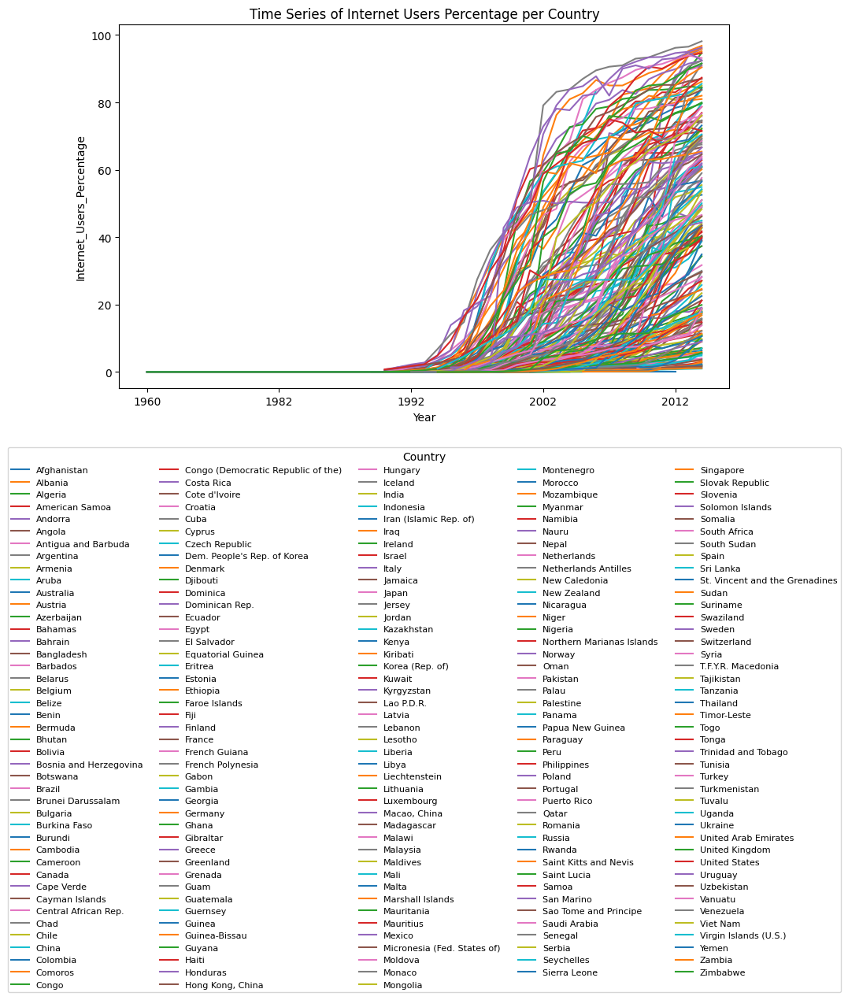

In [2]:
def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    # Drop duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Remove country names that are numeric
    df = df[~df['Country'].str.match(r'^\d+$')]
    # Remove rows where Country is equal to 'footnoteSeqID'
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Read the data
csv_file = 'UNdataExportPercentageOfIndividualsUsingTheInternet.csv'
df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True, error_bad_lines=False, warn_bad_lines=False) # type: ignore

# Clean the data
df = clean_data(df, 'Internet_Users_Percentage')

# Pivot the data to have years as rows and Internet_Users_Percentage as columns
# df_pivot = df.pivot(index='Year', columns='Country', values='Internet_Users_Percentage')

# Create the line chart
# df_pivot.plot(figsize=(10, 6))
# plt.xlabel('Year')
# plt.ylabel('Internet_Users_Percentage')
# plt.title('Time Series of Internet Users Percentage per Country')

# Move the legend to below the chart
# plt.legend(title='Country', ncol=5, fontsize=8, loc='upper center', bbox_to_anchor=(0.5, -0.15))

# plt.show()

Check and see if we should be supporting desktop, web, mobile, or both, also see if there is a general trend in reduced land line usage, and increased mobile usage, countries with a decrease in landline usage and an increase in mobile usage are investing in there digital, mobile, infrastructure.

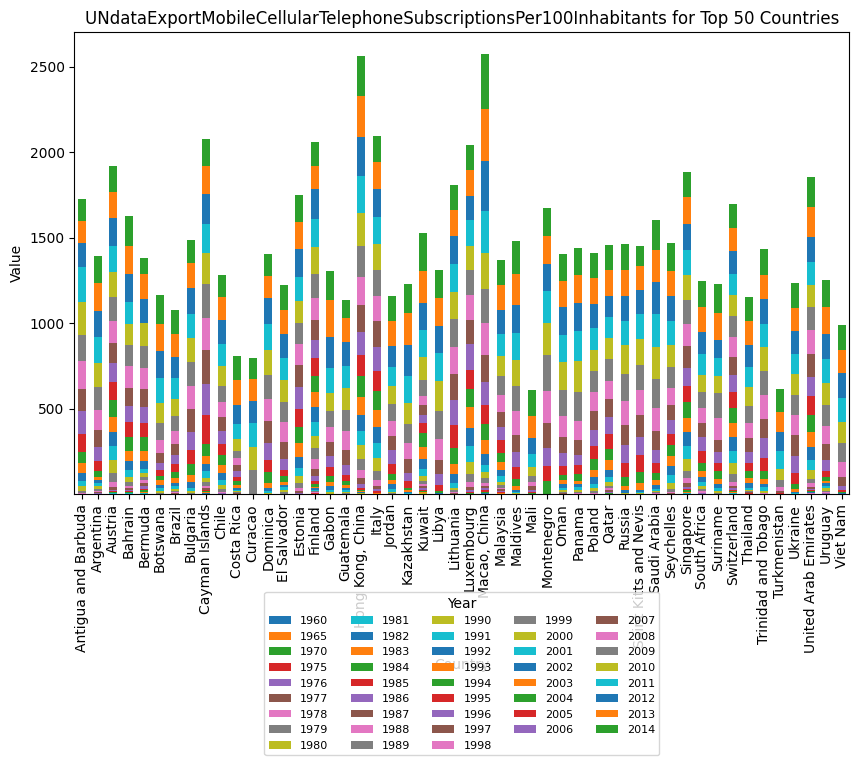

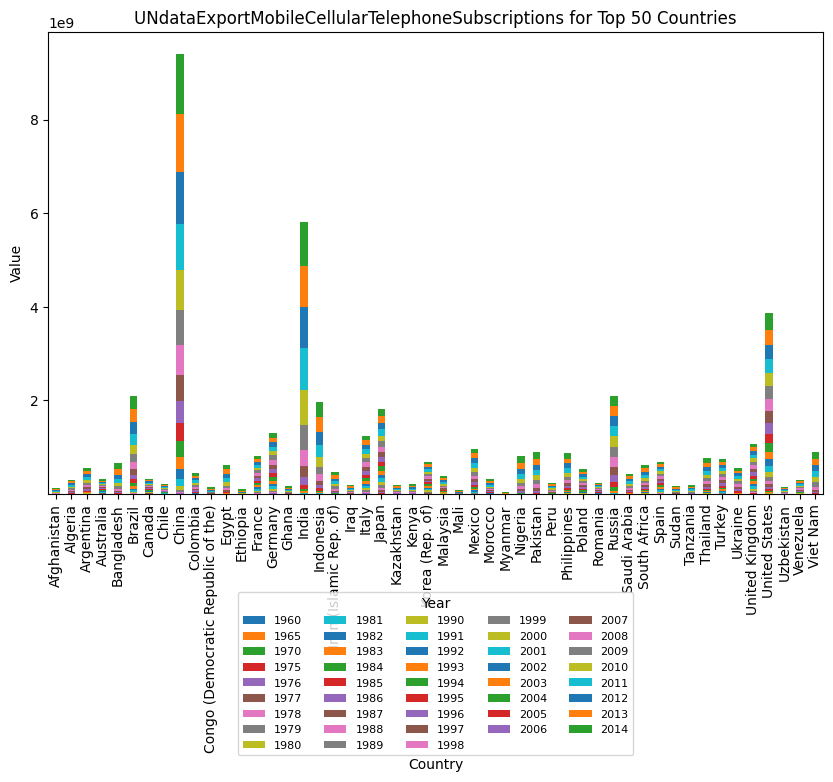

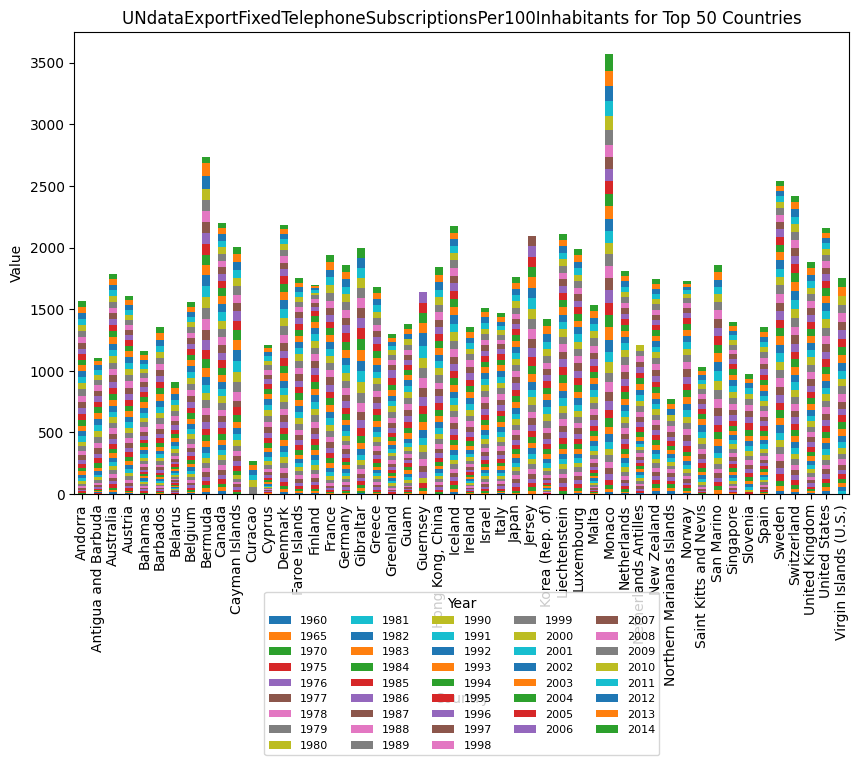

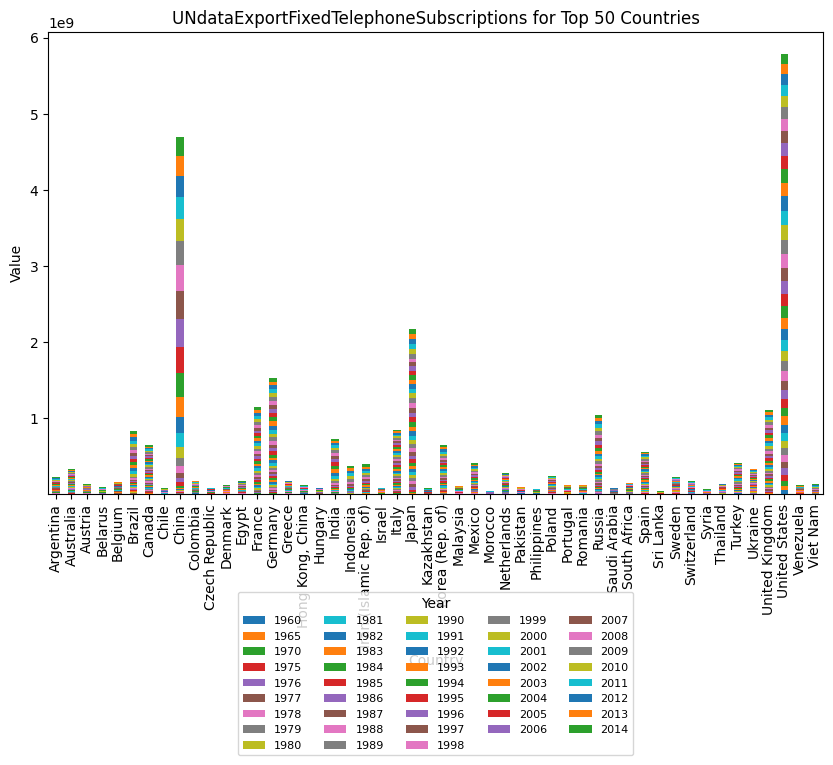

In [3]:
# Define the clean_data function
def clean_data(df):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', 'Value']
    df = df.drop_duplicates(subset=['Country', 'Year'])
    df = df[~df['Country'].str.match(r'^\d+$')]
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Define a list of CSV files
csv_files = ['UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', 
             'UNdataExportMobileCellularTelephoneSubscriptions.csv', 
             'UNdataExportFixedTelephoneSubscriptionsPer100Inhabitants.csv', 
             'UNdataExportFixedTelephoneSubscriptions.csv']

# Loop over each CSV file
for csv_file in csv_files:
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df)
    # Pivot the data to have years as rows and countries as columns
    df_pivot = df.pivot(index='Year', columns='Country', values='Value')
    # Get the top 50 countries
    top_50 = df_pivot.max().sort_values(ascending=False).head(50).index.tolist()
    # Filter the data to include only the top 50 countries
    df_top_50 = df[df['Country'].isin(top_50)]
    # Pivot the filtered data
    df_top_50_pivot = df_top_50.pivot(index='Country', columns='Year', values='Value')
    # Create the bar chart
    df_top_50_pivot.plot(kind='bar', stacked=True, figsize=(10, 6))
    plt.xlabel('Country')
    plt.ylabel('Value')
    plt.title(csv_file.split('.')[0] + ' for Top 50 Countries')
    plt.legend(title='Year', fontsize=8, ncol=5, loc='upper center', bbox_to_anchor=(0.5, -0.2))
    plt.show()


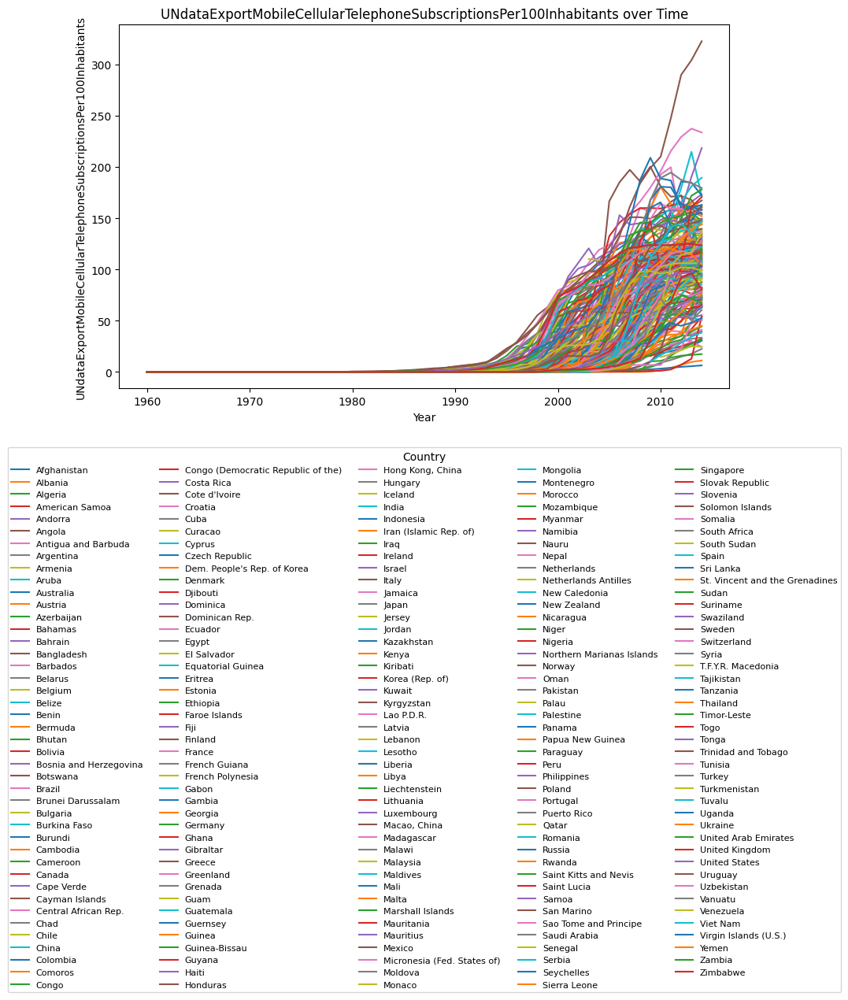

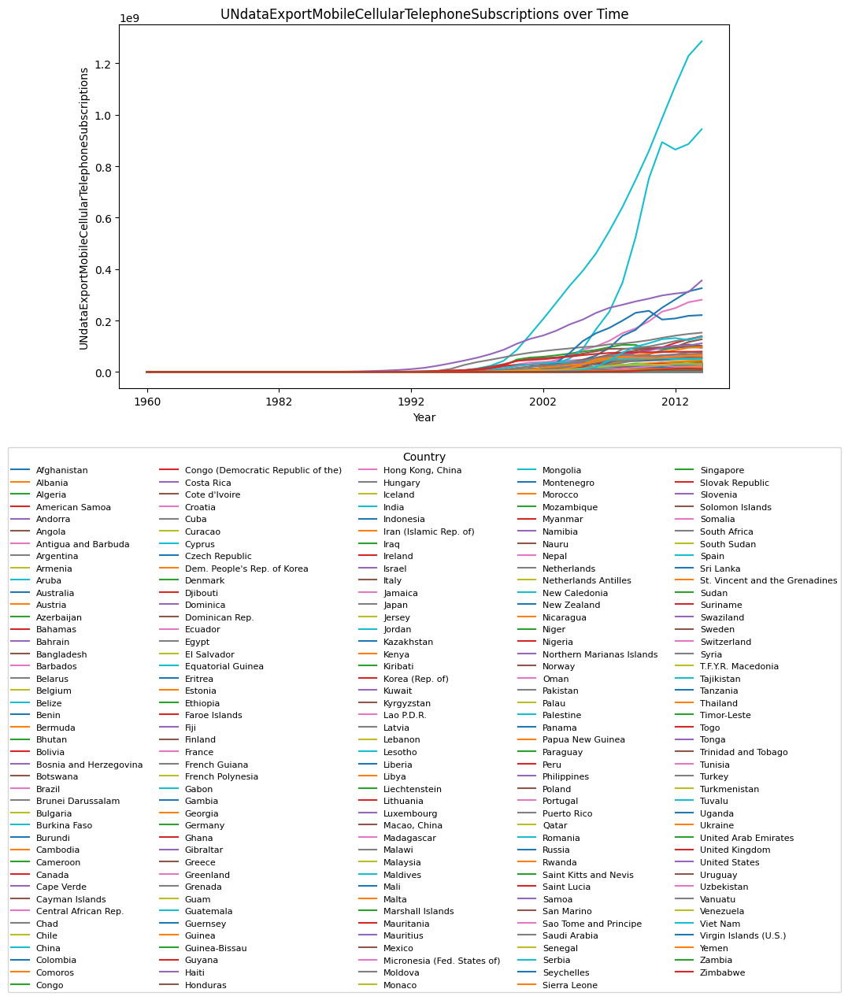

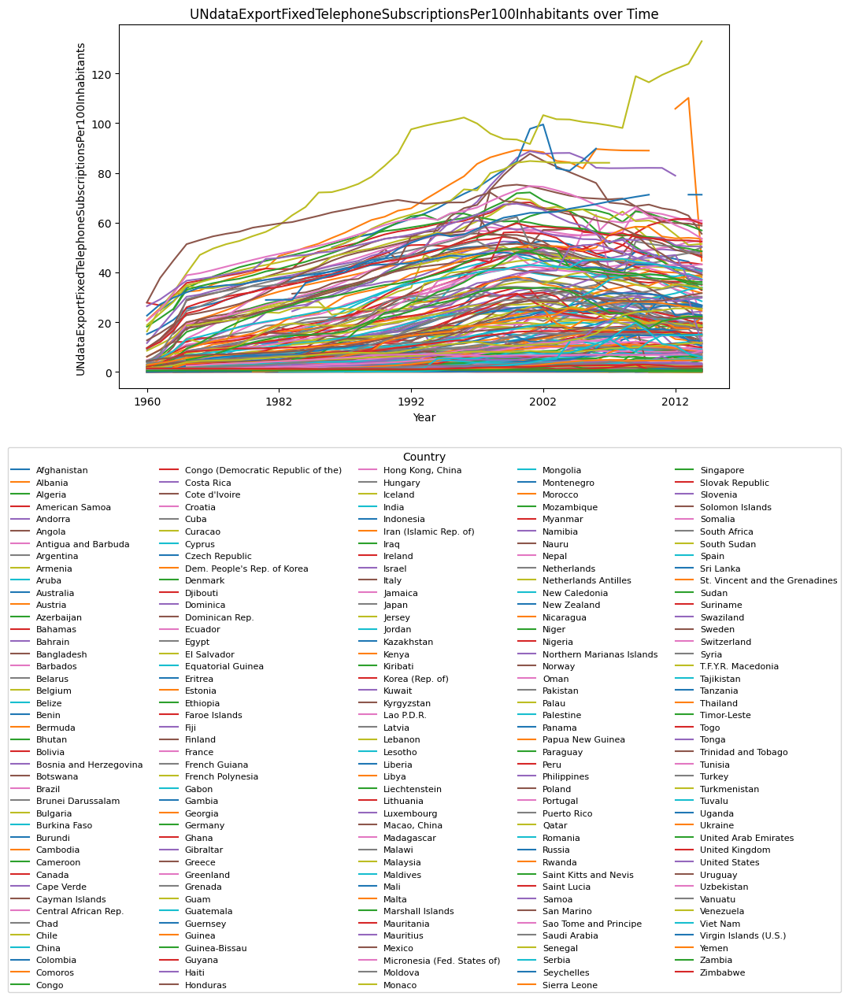

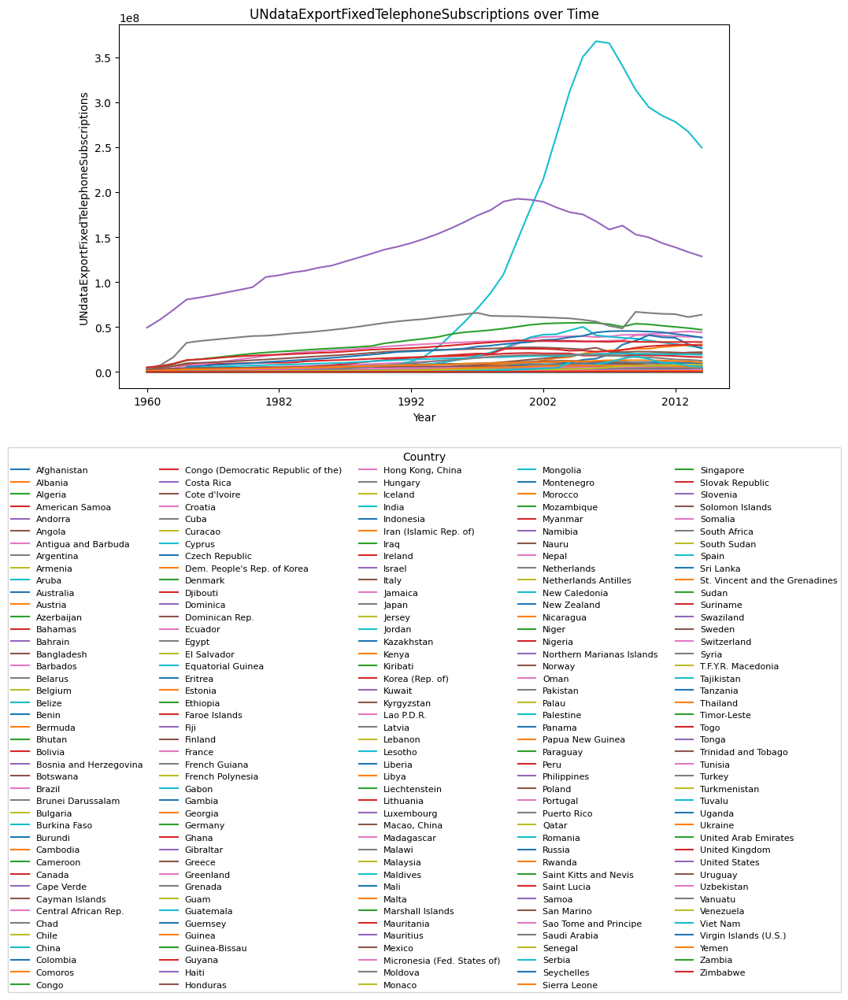

In [4]:
# Define the clean_data function
import re

def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    # Drop duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Remove country names that are numeric
    df = df[~df['Country'].str.match(r'^\d+$')]
    # Remove rows where Country is equal to 'footnoteSeqID'
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Define a list of CSV files
csv_files = ['UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportMobileCellularTelephoneSubscriptions.csv', 'UNdataExportFixedTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportFixedTelephoneSubscriptions.csv']

# Loop over each CSV file
for csv_file in csv_files:
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df, csv_file.split('.')[0])
    # Pivot the data to have years as rows and subscription types as columns
    df_pivot = df.pivot(index='Year', columns='Country', values=csv_file.split('.')[0])
    # Create the line chart
    df_pivot.plot(figsize=(10, 6))
    plt.xlabel('Year')
    plt.ylabel(csv_file.split('.')[0])
    plt.title(csv_file.split('.')[0] + ' over Time')

    # Move the legend to below the chart
    plt.legend(title='Country', ncol=5, fontsize=8, loc='upper center', bbox_to_anchor=(0.5, -0.15))

    plt.show()


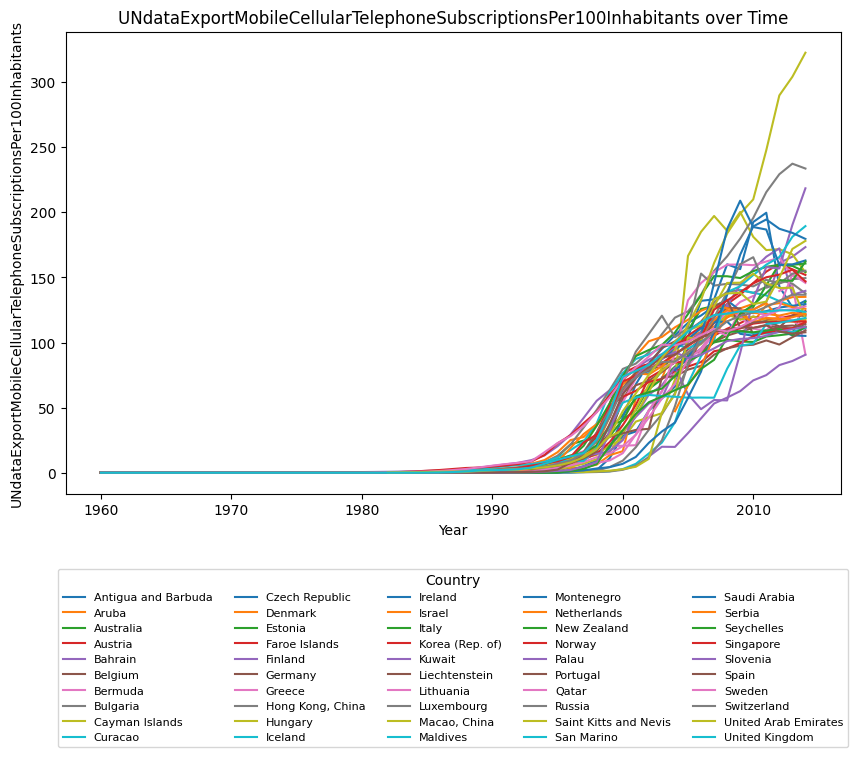

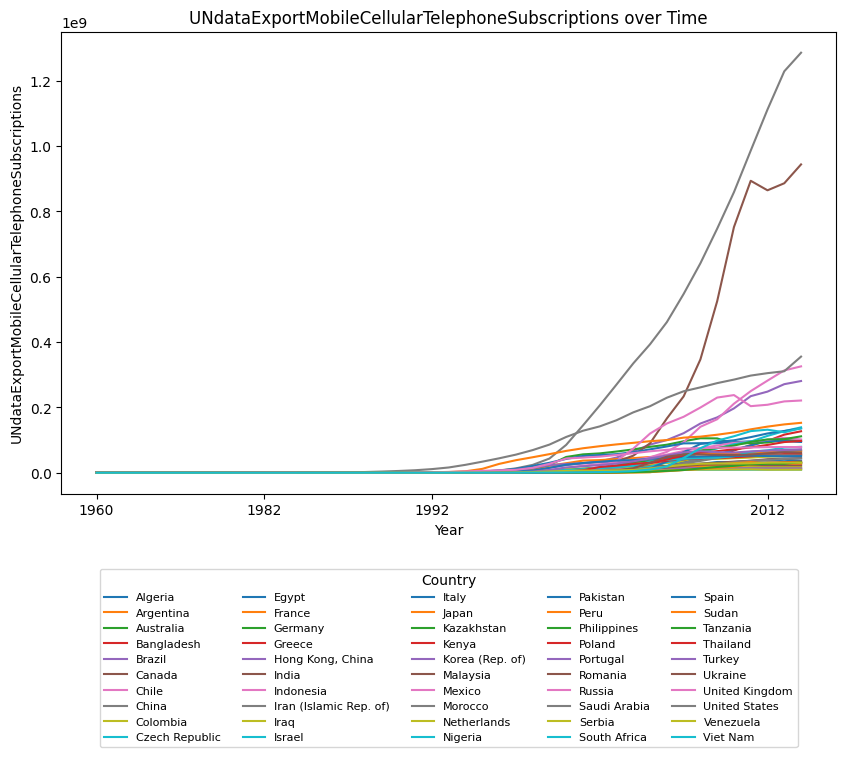

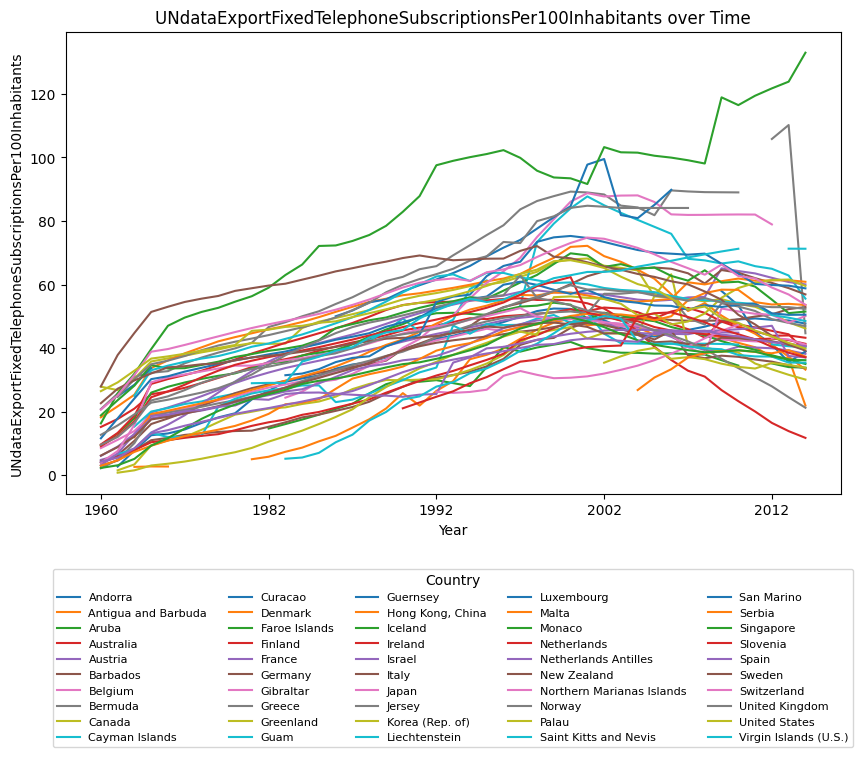

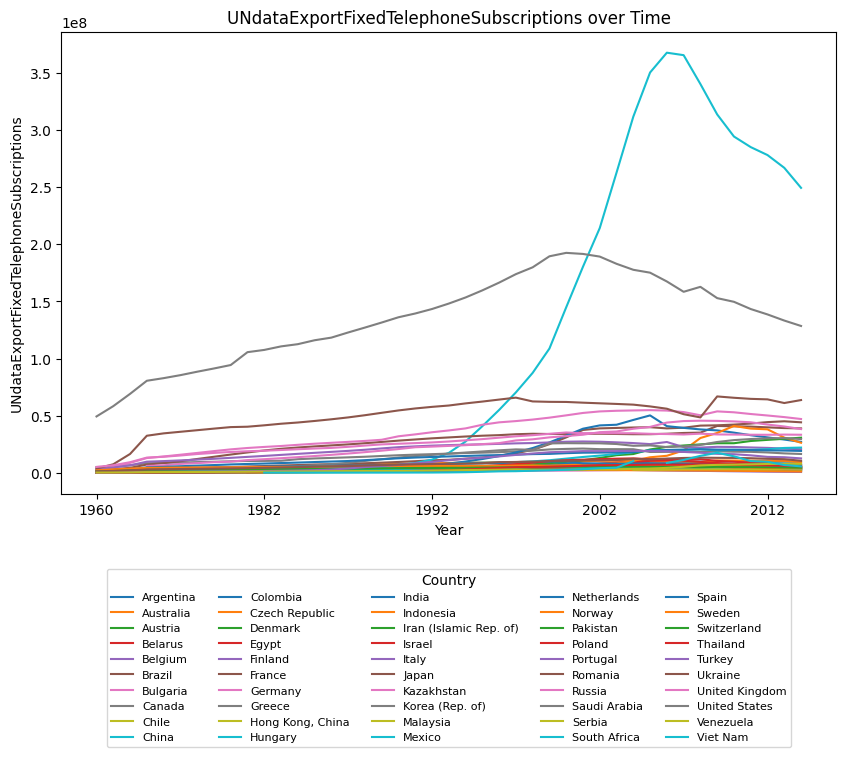

In [5]:
import re

def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    # Drop duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Remove country names that are numeric
    df = df[~df['Country'].str.match(r'^\d+$')]
    # Remove rows where Country is equal to 'footnoteSeqID'
    df = df[df['Country'] != 'footnoteSeqID']
    # Filter data to include only the top 50 countries by their mean value
    df = df[df['Country'].isin(df.groupby('Country')[value_column_name].mean().sort_values(ascending=False).index[:50])]
    return df

# Define a list of CSV files
csv_files = ['UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportMobileCellularTelephoneSubscriptions.csv', 'UNdataExportFixedTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportFixedTelephoneSubscriptions.csv']

# Loop over each CSV file
for csv_file in csv_files:
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df, csv_file.split('.')[0])
    # Pivot the data to have years as rows and subscription types as columns
    df_pivot = df.pivot(index='Year', columns='Country', values=csv_file.split('.')[0])
    # Create the line chart
    df_pivot.plot(figsize=(10, 6))
    plt.xlabel('Year')
    plt.ylabel(csv_file.split('.')[0])
    plt.title(csv_file.split('.')[0] + ' over Time')

    # Move the legend to below the chart
    plt.legend(title='Country', ncol=5, fontsize=8, loc='upper center', bbox_to_anchor=(0.5, -0.15))

    plt.show()


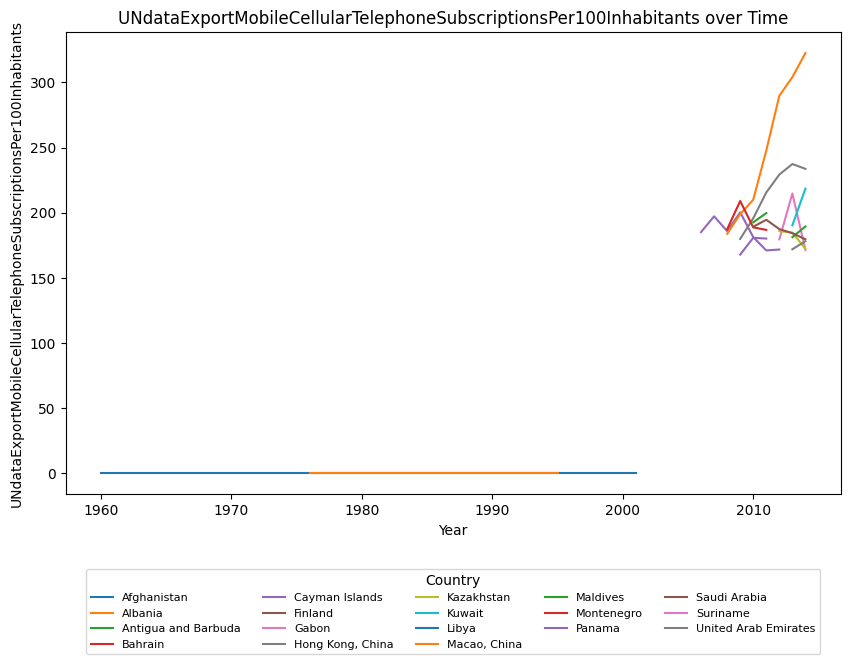

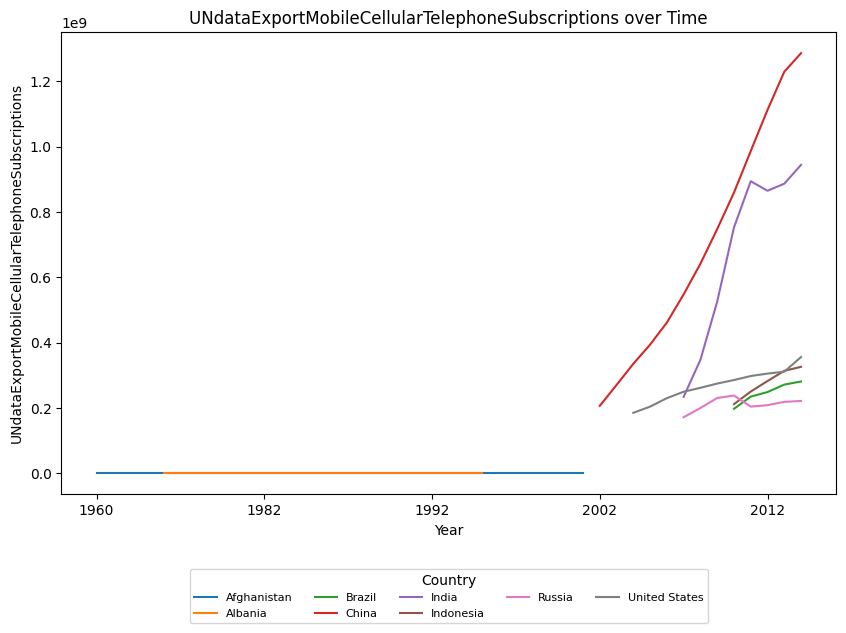

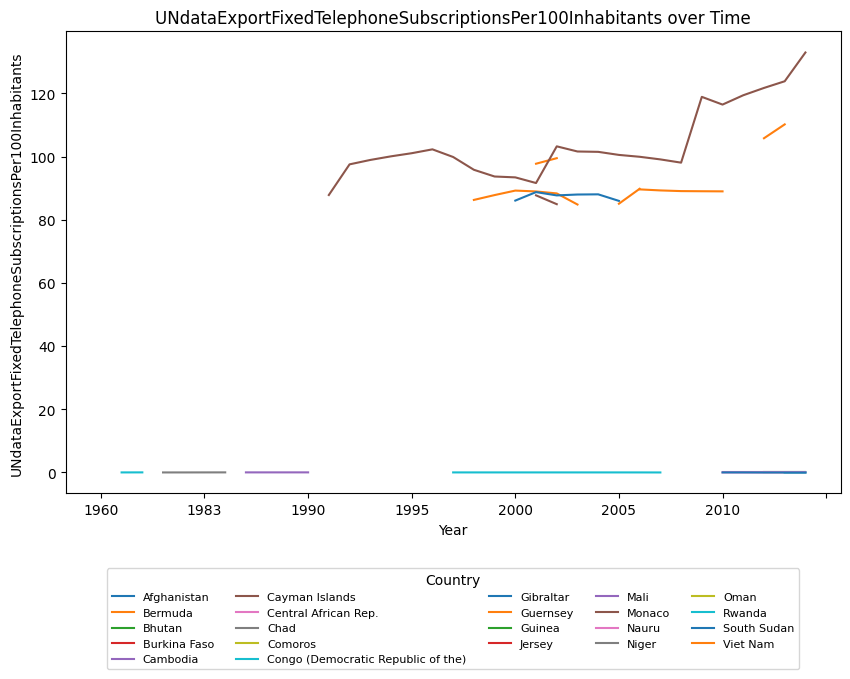

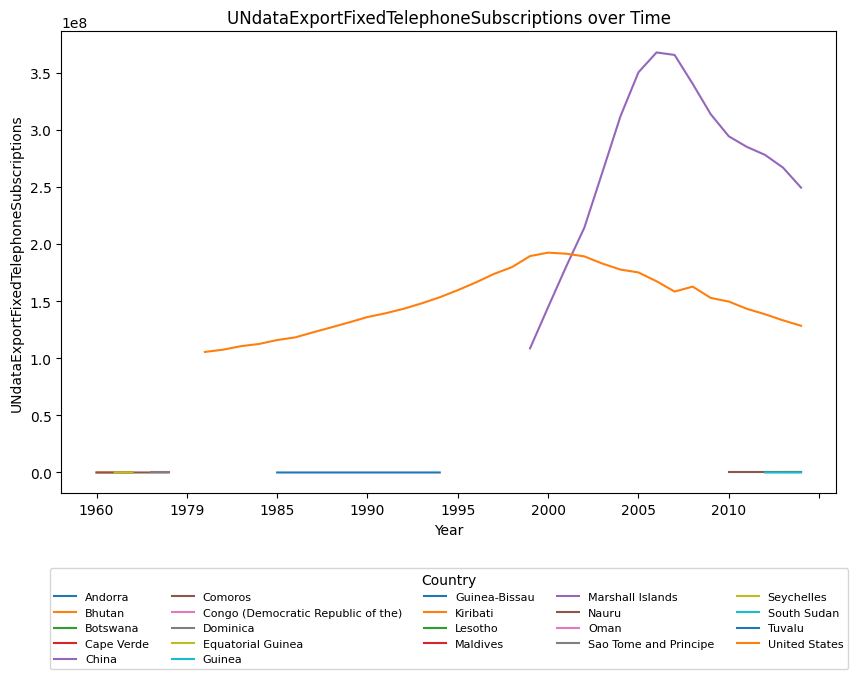

In [6]:
def clean_data(df, value_column_name, num_countries):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    # Drop duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Remove country names that are numeric
    df = df[~df['Country'].str.match(r'^\d+$')]
    # Remove rows where Country is equal to 'footnoteSeqID'
    df = df[df['Country'] != 'footnoteSeqID']
    # Select the top and bottom num_countries
    df_top = df.nlargest(num_countries, value_column_name)
    df_bottom = df.nsmallest(num_countries, value_column_name)
    # Combine the top and bottom data frames
    df_combined = pd.concat([df_top, df_bottom], axis=0)
    return df_combined


# Define a list of CSV files
csv_files = ['UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportMobileCellularTelephoneSubscriptions.csv', 'UNdataExportFixedTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportFixedTelephoneSubscriptions.csv']

# Loop over each CSV file
for csv_file in csv_files:
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df, csv_file.split('.')[0], 50)
    # Pivot the data to have years as rows and subscription types as columns
    df_pivot = df.pivot(index='Year', columns='Country', values=csv_file.split('.')[0])
    # Create the line chart
    df_pivot.plot(figsize=(10, 6))
    plt.xlabel('Year')
    plt.ylabel(csv_file.split('.')[0])
    plt.title(csv_file.split('.')[0] + ' over Time')

    # Move the legend to below the chart
    plt.legend(title='Country', ncol=5, fontsize=8, loc='upper center', bbox_to_anchor=(0.5, -0.15))

    plt.show()

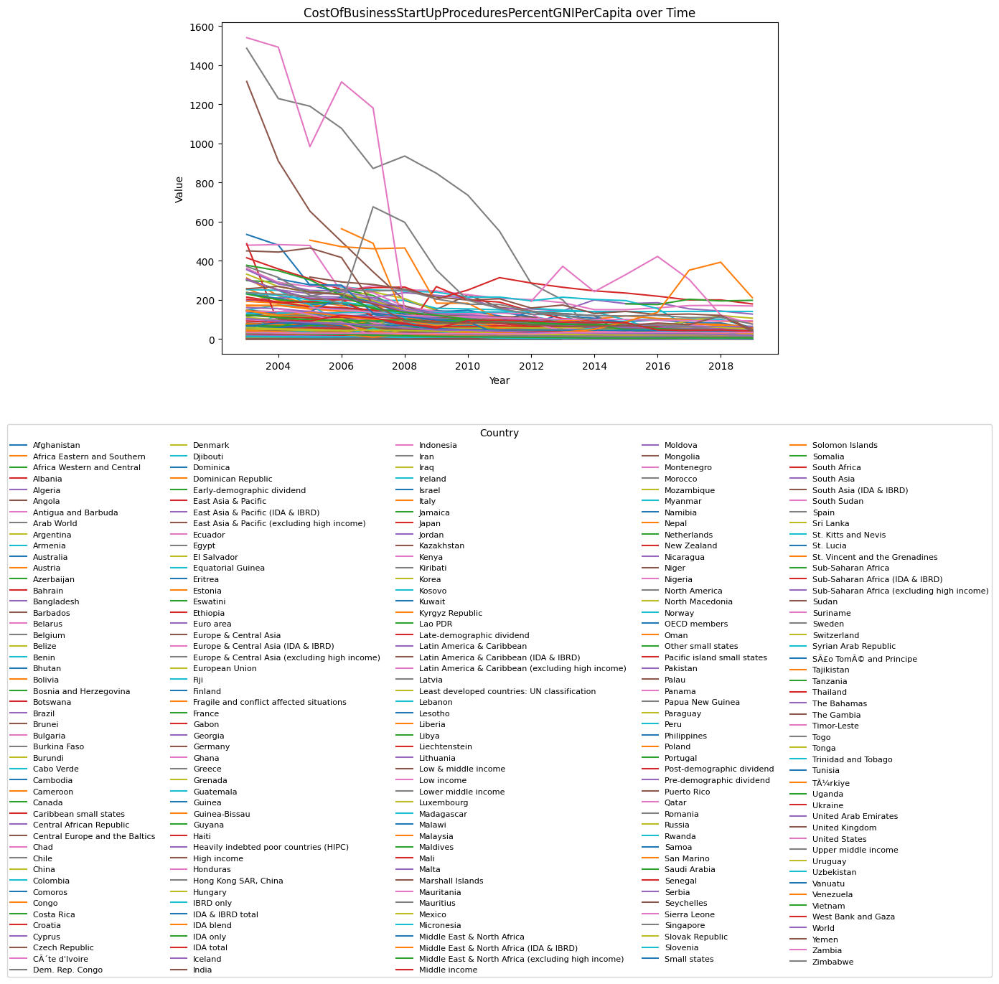

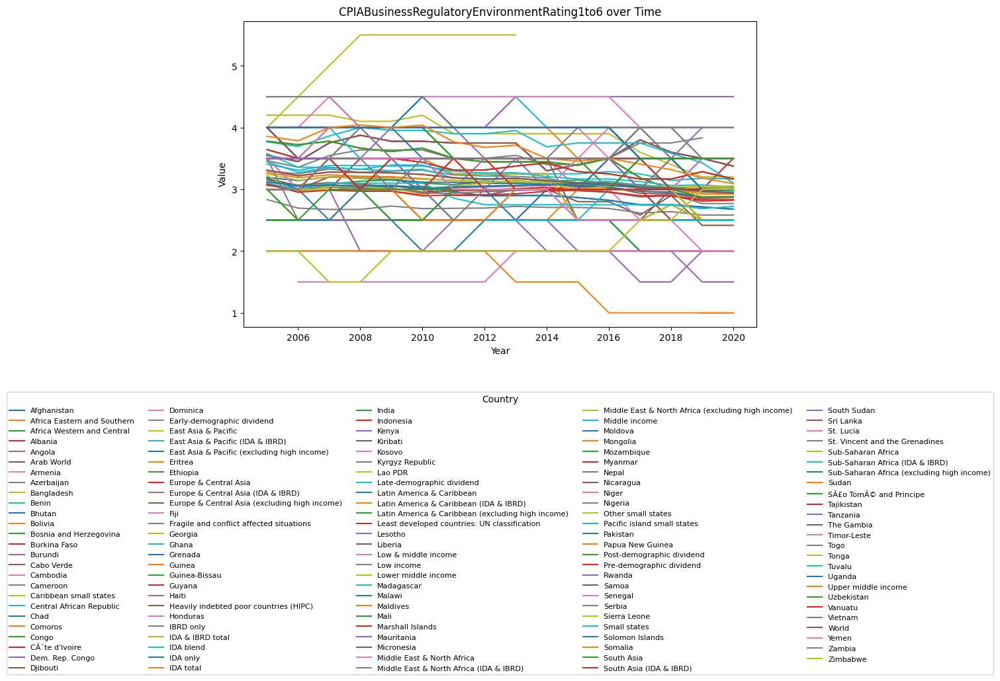

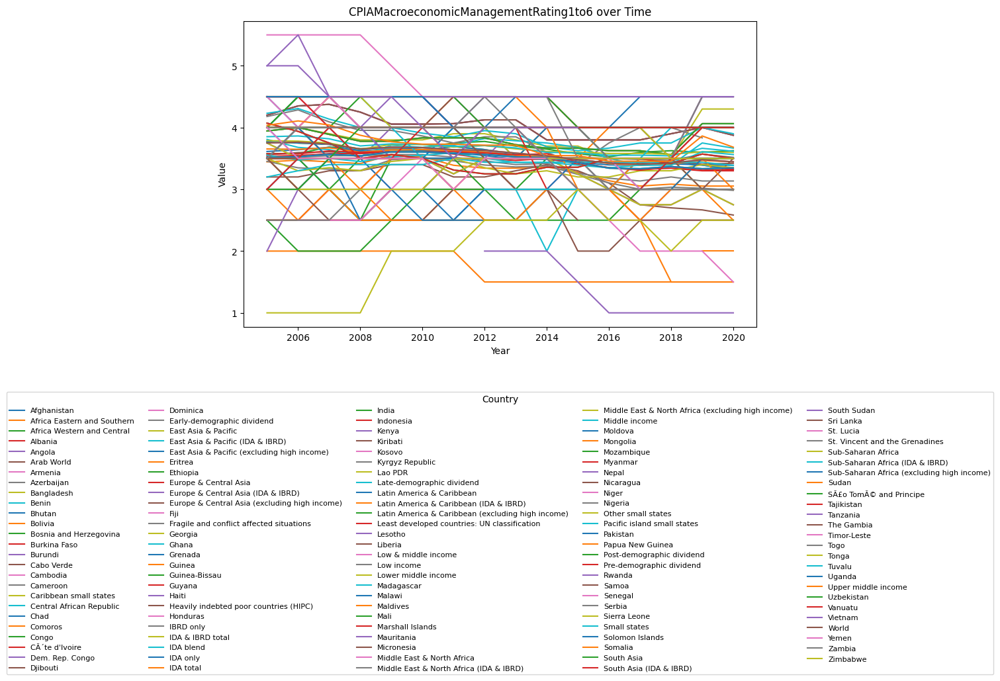

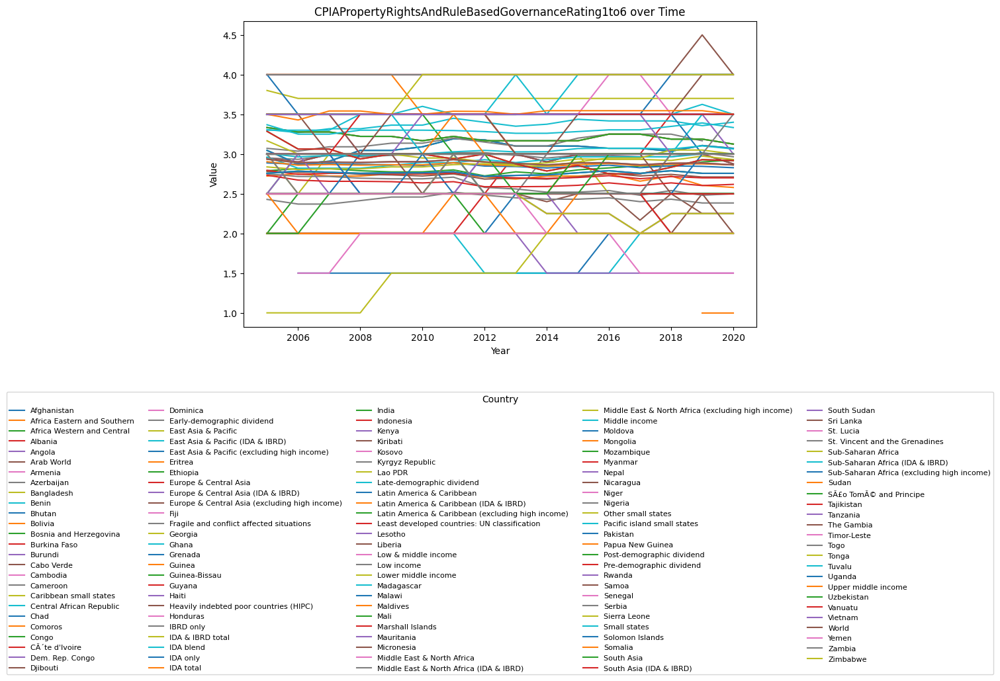

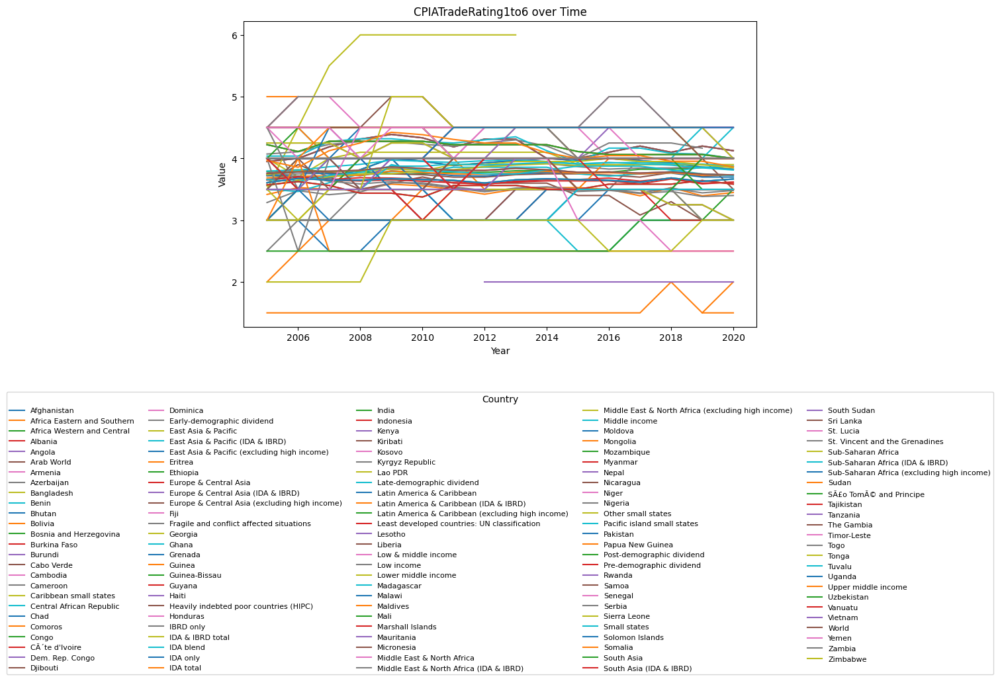

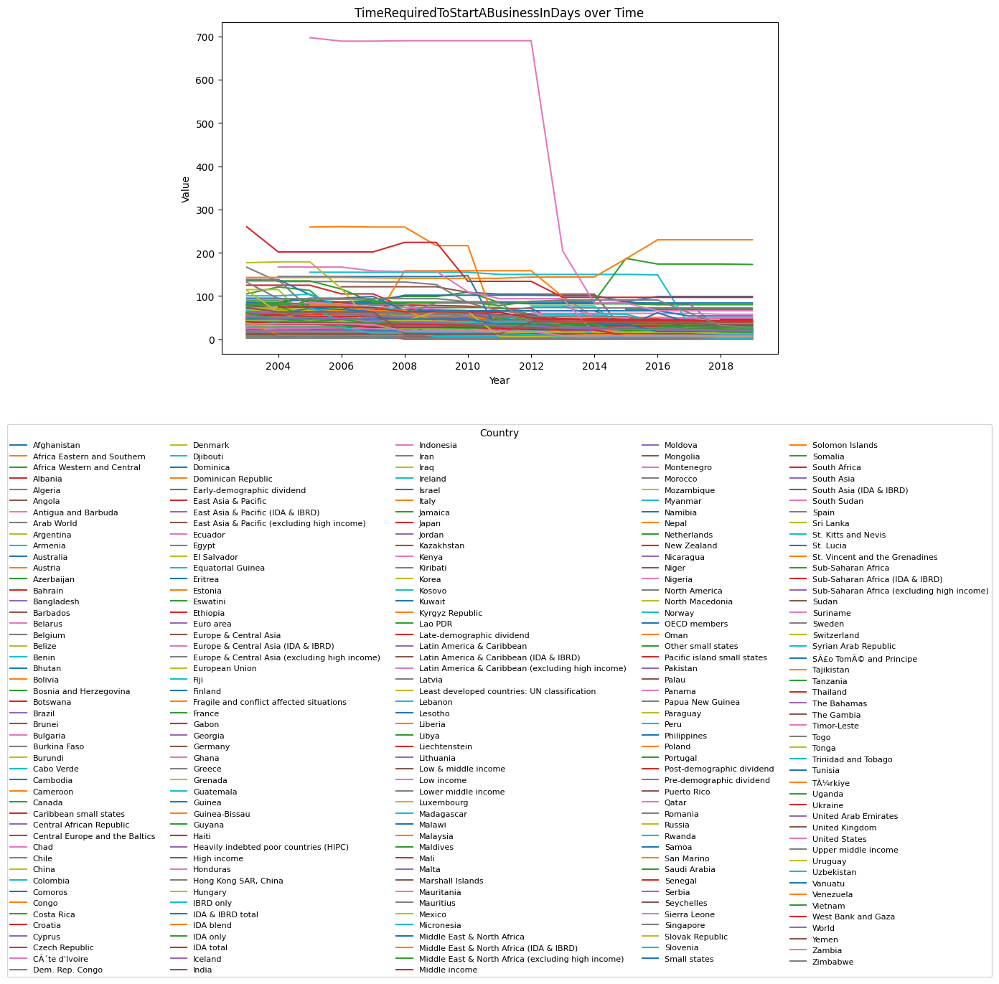

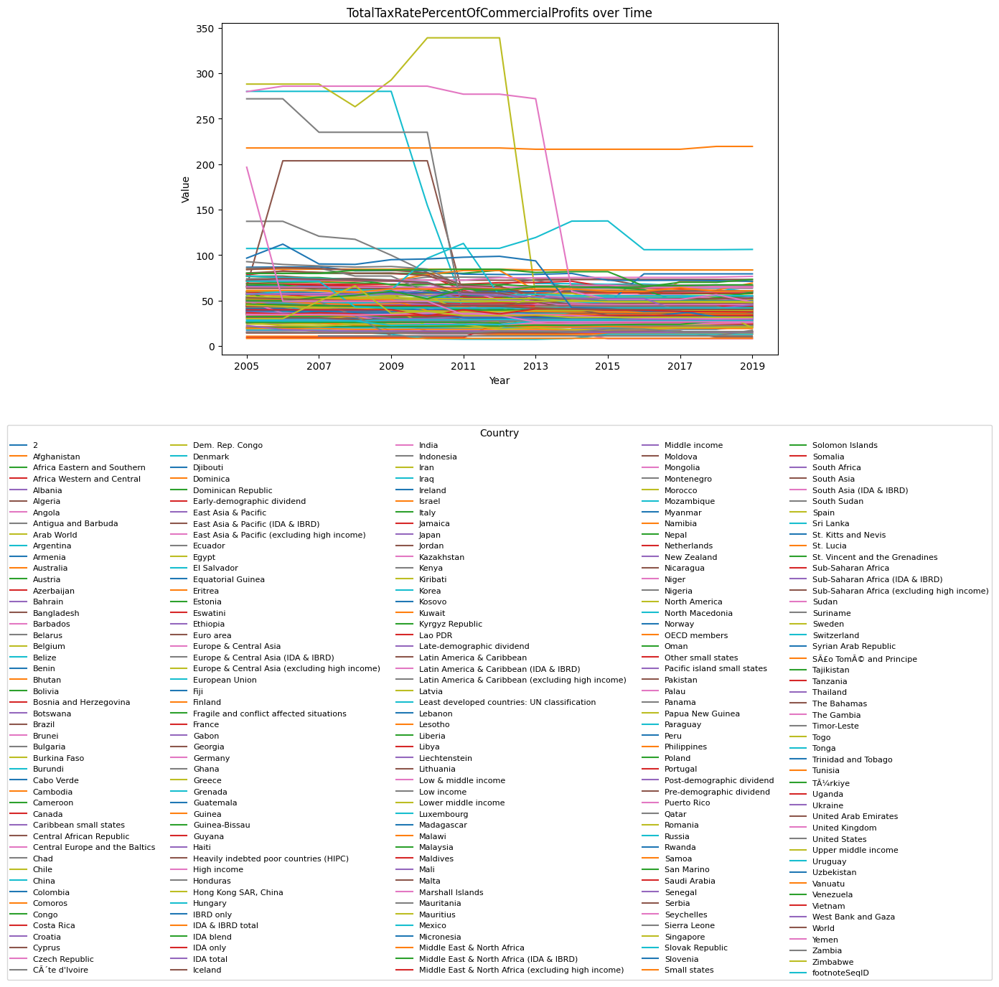

In [7]:
# Define the clean_data function
def clean_data(df):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', 'Value']
    df = df.drop_duplicates(subset=['Country', 'Year'])
    return df

# Define a list of CSV files
csv_files = ['CostOfBusinessStartUpProceduresPercentGNIPerCapita.csv',
             'CPIABusinessRegulatoryEnvironmentRating1to6.csv',
             'CPIAMacroeconomicManagementRating1to6.csv',
             'CPIAPropertyRightsAndRuleBasedGovernanceRating1to6.csv',
             'CPIATradeRating1to6.csv',
             'TimeRequiredToStartABusinessInDays.csv',
             'TotalTaxRatePercentOfCommercialProfits.csv']

# Loop over each CSV file
for csv_file in csv_files:
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df)
    # Pivot the data to have years as rows and countries as columns
    df_pivot = df.pivot(index='Year', columns='Country', values='Value')
    # Create the line chart
    df_pivot.plot(figsize=(10, 6))
    plt.xlabel('Year')
    plt.ylabel('Value')
    plt.title(csv_file.split('.')[0] + ' over Time')
    plt.legend(title='Country', fontsize=8, loc='upper center', ncol=5, bbox_to_anchor=(0.5, -0.2))
    plt.show()

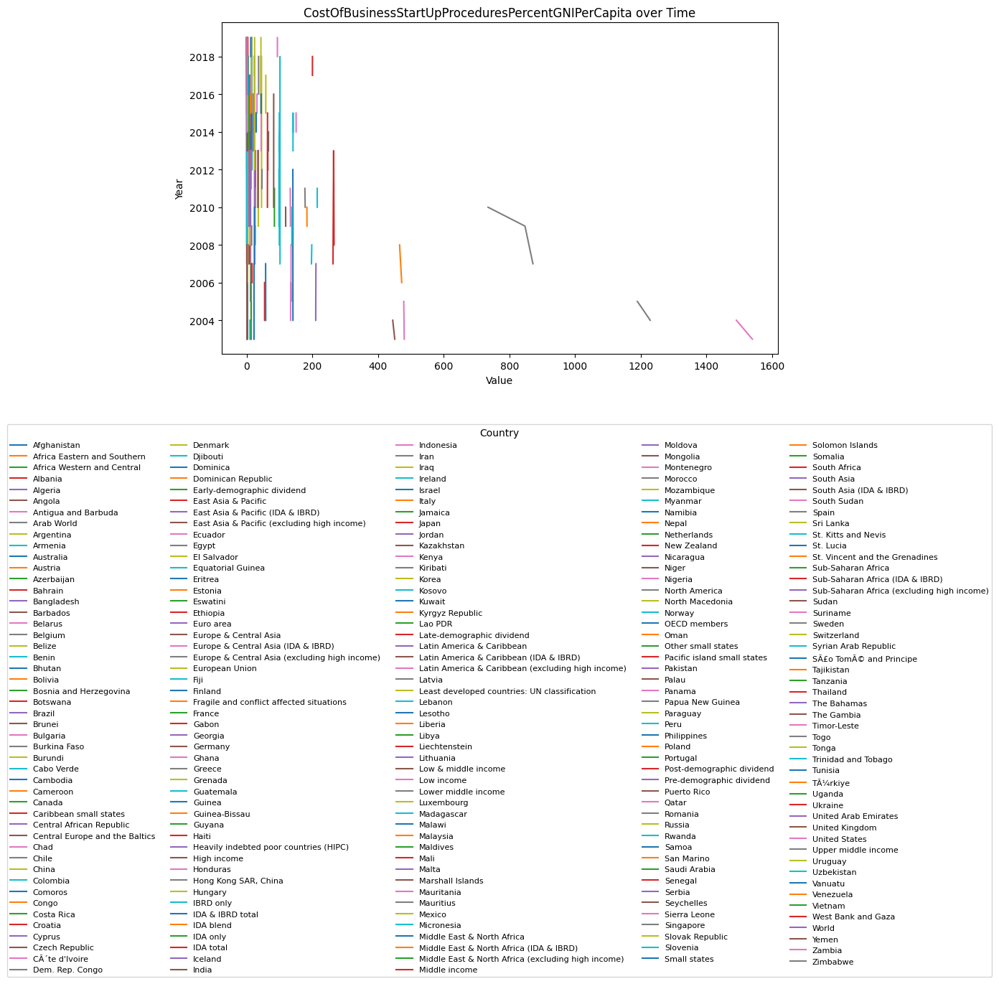

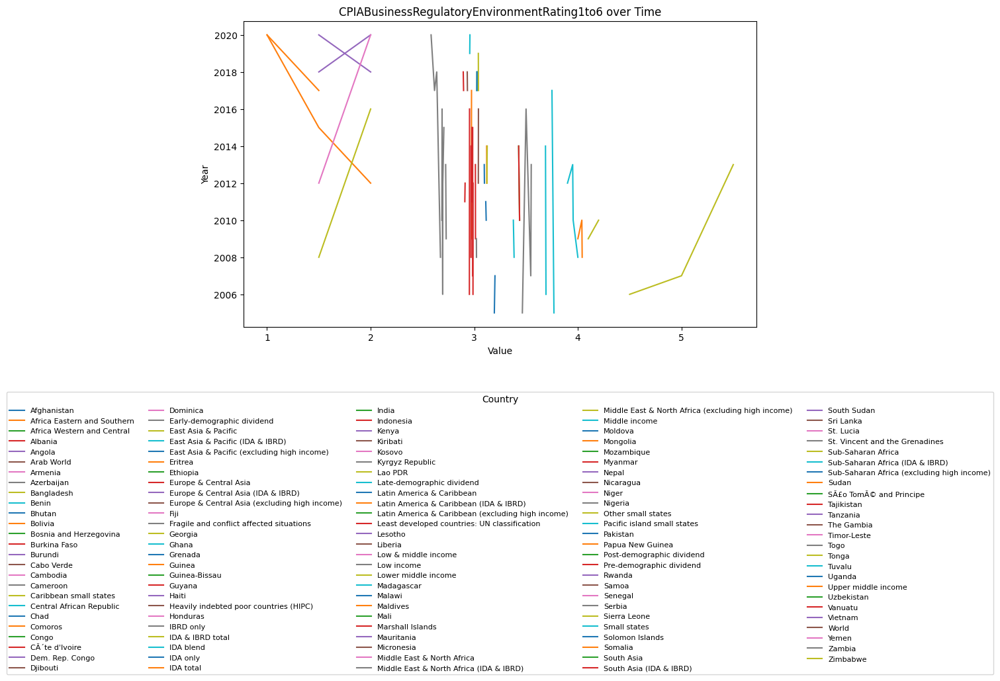

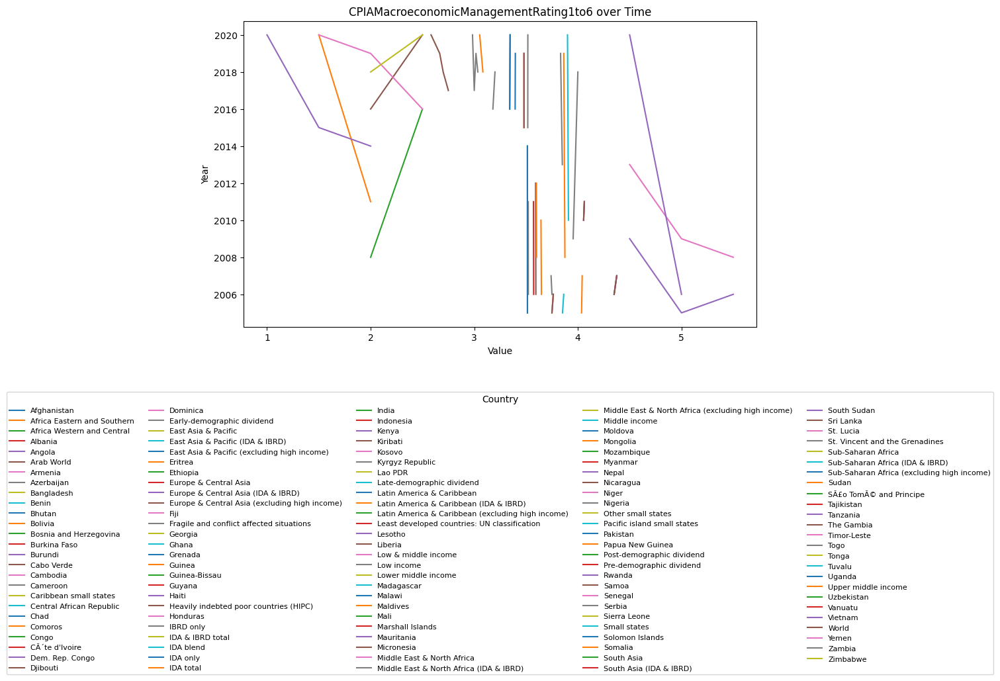

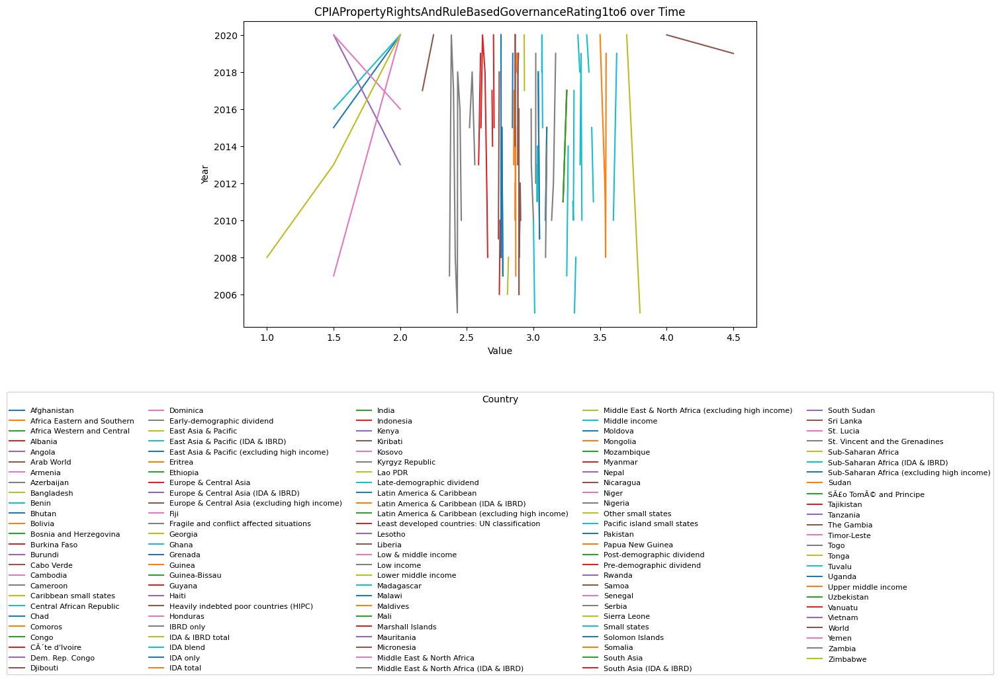

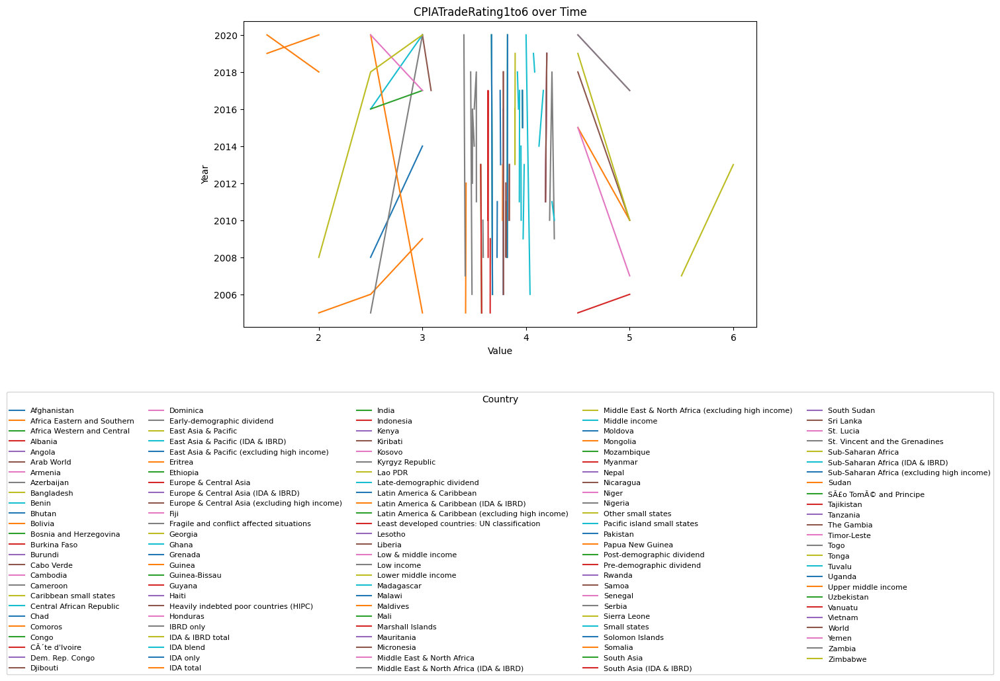

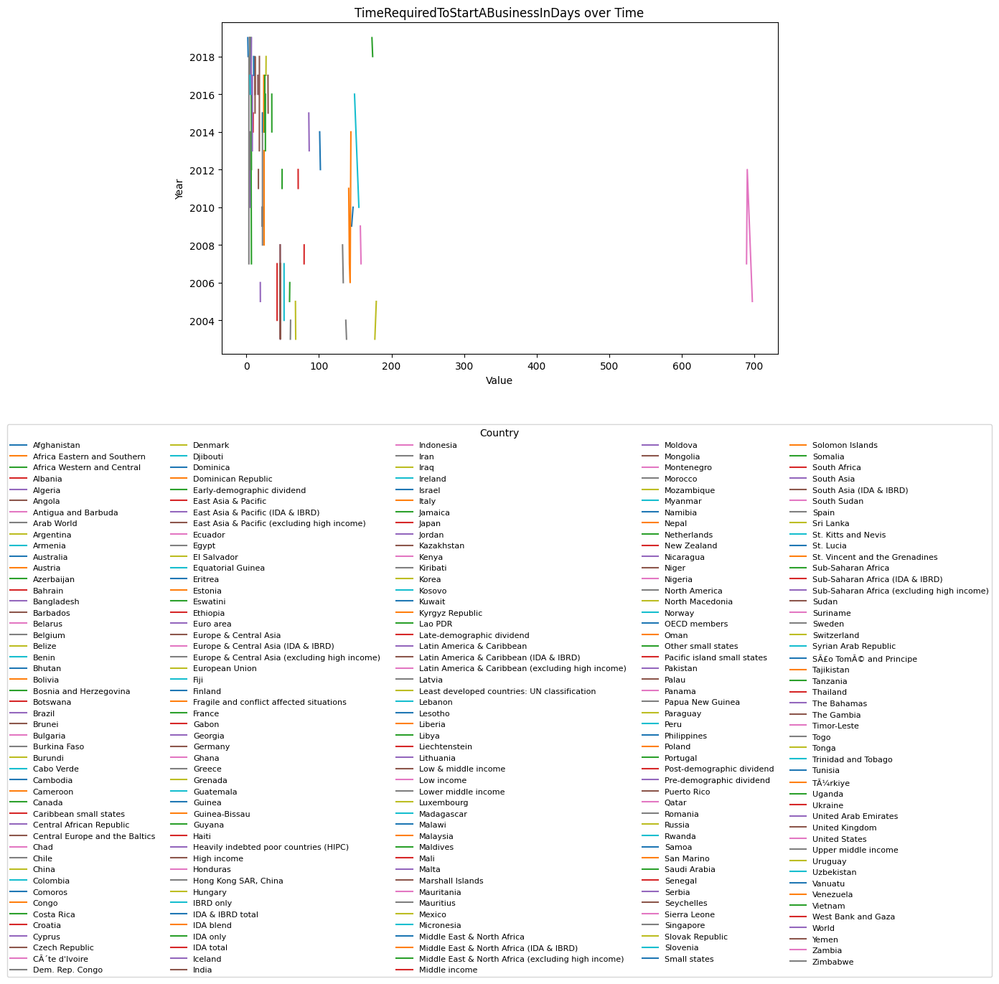

In [8]:
# Define the clean_data function
def clean_data(df):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', 'Value']
    df = df.drop_duplicates(subset=['Country', 'Value'])
    return df


# Define a list of CSV files
csv_files = ['CostOfBusinessStartUpProceduresPercentGNIPerCapita.csv',
             'CPIABusinessRegulatoryEnvironmentRating1to6.csv',
             'CPIAMacroeconomicManagementRating1to6.csv',
             'CPIAPropertyRightsAndRuleBasedGovernanceRating1to6.csv',
             'CPIATradeRating1to6.csv',
             'TimeRequiredToStartABusinessInDays.csv']

# Loop over each CSV file
for csv_file in csv_files:
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df)
    # Pivot the data to have years as rows and countries as columns
    df_pivot = df.pivot(index='Value', columns='Country', values='Year')
    # Create the line chart
    df_pivot.plot(figsize=(10, 6))
    plt.xlabel('Value')
    plt.ylabel('Year')
    plt.title(csv_file.split('.')[0] + ' over Time')
    plt.legend(title='Country', fontsize=8, loc='upper center', ncol=5, bbox_to_anchor=(0.5, -0.2))
    plt.show()

In [9]:
# Define the clean_data function
def clean_data(df):
    # Remove the Value Footnotes and footnoteSeqID columns
    df = df.drop(columns=['Value Footnotes'])
    # Rename the columns
    df.columns = ['Country', 'Year', 'Value']
    # Drop any duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Drop any rows where the Value column is NaN
    df = df.dropna(subset=['Value'])
    # Convert the Value column to numeric
    df['Value'] = pd.to_numeric(df['Value'], errors='coerce')
    # Remove the last three rows
    df = df[:-3]
    return df

# Define a list of CSV files
csv_files = ['TotalTaxRatePercentOfCommercialProfits.csv']

# Loop over each CSV file
for csv_file in csv_files:
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df)
    # Pivot the data to have years as rows and countries as columns
    df_pivot = df.pivot(index='Value', columns='Country', values='Year')
    # Create the line chart
    df_pivot.plot(figsize=(10, 6))
    plt.xlabel('Value')
    plt.ylabel('Year')
    plt.title(csv_file.split('.')[0] + ' over Time')
    plt.legend(title='Country', fontsize=8, loc='upper center', ncol=5, bbox_to_anchor=(0.5, -0.2))
    plt.show()

ValueError: Index contains duplicate entries, cannot reshape

In [ ]:

csv_files = [
    'UNdataExportMobileCellularTelephoneSubscriptions.csv',
    'UNdataExportPercentageOfIndividualsUsingTheInternet.csv',
    'CPIABusinessRegulatoryEnvironmentRating1to6.csv',
    'CPIAMacroeconomicManagementRating1to6.csv',
    'CPIAPropertyRightsAndRuleBasedGovernanceRating1to6.csv',
    'CPIATradeRating1to6.csv'
]

def read_csv_remove_bad_lines(csv_file):
    expected_num_columns = 4

    with open(csv_file, 'r', encoding='utf-8', errors='replace') as file:
        reader = csv.reader(file)

        # Read the header
        header = next(reader)
        valid_lines = [header]

        # Read the rest of the lines and keep only the valid ones
        for line in reader:
            if len(line) == expected_num_columns:
                valid_lines.append(line)

    return pd.DataFrame(valid_lines[1:], columns=valid_lines[0])

# Assuming all CSVs have the same format: Country, Year, Value
def read_and_process_csv(csv_file):
    df = read_csv_remove_bad_lines(csv_file)
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', 'Value']
    df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
    df['Value'] = pd.to_numeric(df['Value'], errors='coerce')
    df = df.drop_duplicates(subset=['Country', 'Year'])
    df = df[~df['Country'].str.match(r'^\d+$')]
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Read and process all CSV files
dataframes = [read_and_process_csv(csv_file) for csv_file in csv_files]

# Find the top 50 countries in each file
top_50_countries_list = [set(df.sort_values(by='Value', ascending=False).drop_duplicates(subset=['Country'])['Country'].head(50)) for df in dataframes]

# Find the intersection of top 50 countries in each file
common_top_50_countries = set.intersection(*top_50_countries_list)

# Print top 50 countries for each dataset
for i, countries in enumerate(top_50_countries_list):
    print(f"Top 50 countries for dataset {i + 1}:")
    print(sorted(list(countries)))
    print()

# Print common top 50 countries
print("Intersection of top 50 countries:")
print(sorted(list(common_top_50_countries)))
# Print top 50 countries for each dataset
for i, countries in enumerate(top_50_countries_list):
    print(f"Top 50 countries for dataset {i + 1}:")
    print(sorted(list(countries)))
    print()

# Print common top 50 countries
print("Intersection of top 50 countries:")
print(sorted(list(common_top_50_countries)))
# Filter data for the common top 50 countries
filtered_dataframes = [df[df['Country'].isin(common_top_50_countries)] for df in dataframes]

# Merge the dataframes on 'Country' and 'Year' columns
merged_df = filtered_dataframes[0]
for i in range(1, len(filtered_dataframes)):
    merged_df = pd.merge(merged_df, filtered_dataframes[i], on=['Country', 'Year'], suffixes=(f'_file{i}', f'_file{i + 1}'))

# Pivot the data to have years as rows and values as columns for each file
pivoted_dataframes = [merged_df.pivot(index='Year', columns='Country', values=f'Value_file{i + 1}') for i in range(len(filtered_dataframes))]

# Create line charts for each file
for i, pivoted_df in enumerate(pivoted_dataframes):
    if not pivoted_df.empty:
        print(pivoted_df.head())  # Print the first few rows of the pivoted DataFrame
        pivoted_df.plot(figsize=(10, 6))
        plt.xlabel('Year')
        plt.ylabel('Value')
        plt.title(f'Time Series for Common Top 50 Countries in File {i + 1}')
        plt.legend(title='Country', ncol=5, fontsize=8, loc='upper center', bbox_to_anchor=(0.5, -0.15))
        plt.show()
    else:
        print(f"No data to plot for File {i + 1}")

Top 50 countries for dataset 1:
['Afghanistan', 'Algeria', 'Argentina', 'Australia', 'Bangladesh', 'Brazil', 'Canada', 'Chile', 'China', 'Colombia', 'Congo (Democratic Republic of the)', 'Egypt', 'Ethiopia', 'France', 'Germany', 'Ghana', 'India', 'Indonesia', 'Iran (Islamic Rep. of)', 'Iraq', 'Italy', 'Japan', 'Kazakhstan', 'Kenya', 'Korea (Rep. of)', 'Malaysia', 'Mali', 'Mexico', 'Morocco', 'Myanmar', 'Nigeria', 'Pakistan', 'Peru', 'Philippines', 'Poland', 'Romania', 'Russia', 'Saudi Arabia', 'South Africa', 'Spain', 'Sudan', 'Tanzania', 'Thailand', 'Turkey', 'Ukraine', 'United Kingdom', 'United States', 'Uzbekistan', 'Venezuela', 'Viet Nam']

Top 50 countries for dataset 2:
['Andorra', 'Aruba', 'Australia', 'Austria', 'Bahamas', 'Bahrain', 'Barbados', 'Belgium', 'Bermuda', 'Canada', 'Cayman Islands', 'Chile', 'Czech Republic', 'Denmark', 'Estonia', 'Faroe Islands', 'Finland', 'France', 'Germany', 'Guernsey', 'Hong Kong, China', 'Hungary', 'Iceland', 'Ireland', 'Israel', 'Japan', 'Kor

In [ ]:
csv_files = [
    'UNdataExportMobileCellularTelephoneSubscriptions.csv',
    'UNdataExportPercentageOfIndividualsUsingTheInternet.csv',
    'CPIABusinessRegulatoryEnvironmentRating1to6.csv',
    'CPIAMacroeconomicManagementRating1to6.csv',
    'CPIAPropertyRightsAndRuleBasedGovernanceRating1to6.csv',
    'CPIATradeRating1to6.csv'
]

def read_csv_remove_bad_lines(csv_file):
    expected_num_columns = 4

    with open(csv_file, 'r', encoding='utf-8', errors='replace') as file:
        reader = csv.reader(file)

        header = next(reader)
        valid_lines = [header]

        for line in reader:
            if len(line) == expected_num_columns:
                valid_lines.append(line)

    return pd.DataFrame(valid_lines[1:], columns=valid_lines[0])

def read_and_process_csv(csv_file):
    df = read_csv_remove_bad_lines(csv_file)
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', 'Value']
    df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
    df['Value'] = pd.to_numeric(df['Value'], errors='coerce')
    df = df.drop_duplicates(subset=['Country', 'Year'])
    df = df[~df['Country'].str.match(r'^\d+$')]
    df = df[df['Country'] != 'footnoteSeqID']
    return df

dataframes = [read_and_process_csv(csv_file) for csv_file in csv_files]

top_50_countries_list = [set(df.nlargest(50, 'Value')['Country']) for df in dataframes]

# Find the intersection of top 50 countries in datasets 1 and 2
common_top_50_datasets_1_and_2 = set.intersection(top_50_countries_list[0], top_50_countries_list[1])

# Find the intersection of top 50 countries in datasets 3, 4, 5, and 6
common_top_50_datasets_3_to_6 = set.intersection(top_50_countries_list[2], top_50_countries_list[3], top_50_countries_list[4], top_50_countries_list[5])

# Print common top 50 countries in datasets 1 and 2
print("Intersection of top 50 countries in datasets 1 and 2:")
print(sorted(list(common_top_50_datasets_1_and_2)))
print()

# Print common top 50 countries in datasets 3, 4, 5, and 6
print("Intersection of top 50 countries in datasets 3, 4, 5, and 6:")
print(sorted(list(common_top_50_datasets_3_to_6)))

Intersection of top 50 countries in datasets 1 and 2:
['Australia', 'Canada', 'Chile', 'France', 'Germany', 'Japan', 'Korea (Rep. of)', 'Russia', 'Spain', 'United Kingdom', 'United States']

Intersection of top 50 countries in datasets 3, 4, 5, and 6:
['Albania', 'Armenia', 'Benin', 'Bosnia and Herzegovina', 'Burkina Faso', 'Cabo Verde', "CÃ´te d'Ivoire", 'Dominica', 'Georgia', 'IBRD only', 'Kenya', 'Late-demographic dividend', 'Moldova', 'Rwanda', 'Senegal']


In [ ]:
def get_most_recent_top_100(df):
    most_recent_years = df.groupby('Country')['Year'].max()
    most_recent_data = pd.merge(df, most_recent_years, on=['Country', 'Year'])
    top_100 = most_recent_data.nlargest(100, 'Value')['Country']
    return set(top_100)

dataframes = [read_and_process_csv(csv_file) for csv_file in csv_files]

top_100_countries_list = [get_most_recent_top_100(df) for df in dataframes]

# Find the intersection of top 100 countries in datasets 1 and 2
common_top_100_datasets_1_and_2 = set.intersection(top_100_countries_list[0], top_100_countries_list[1])

# Find the intersection of top 100 countries in datasets 3, 4, 5, and 6
common_top_100_datasets_3_to_6 = set.intersection(top_100_countries_list[2], top_100_countries_list[3], top_100_countries_list[4], top_100_countries_list[5])

# Print common top 100 countries in datasets 1 and 2
print("Intersection of top 100 countries in datasets 1 and 2:")
print(sorted(list(common_top_100_datasets_1_and_2)))
print()

# Print common top 100 countries in datasets 3, 4, 5, and 6
print("Intersection of top 100 countries in datasets 3, 4, 5, and 6:")
print(sorted(list(common_top_100_datasets_3_to_6)))

Intersection of top 100 countries in datasets 1 and 2:
['Argentina', 'Australia', 'Austria', 'Azerbaijan', 'Belarus', 'Belgium', 'Brazil', 'Bulgaria', 'Canada', 'Chile', 'China', 'Colombia', 'Czech Republic', 'Dominican Rep.', 'Finland', 'France', 'Germany', 'Greece', 'Hong Kong, China', 'Hungary', 'Israel', 'Italy', 'Japan', 'Kazakhstan', 'Korea (Rep. of)', 'Kuwait', 'Malaysia', 'Morocco', 'Netherlands', 'Poland', 'Portugal', 'Romania', 'Russia', 'Saudi Arabia', 'Serbia', 'Singapore', 'South Africa', 'Spain', 'Sweden', 'Switzerland', 'Turkey', 'United Arab Emirates', 'United Kingdom', 'United States', 'Venezuela']

Intersection of top 100 countries in datasets 3, 4, 5, and 6:
['Africa Western and Central', 'Albania', 'Armenia', 'Azerbaijan', 'Benin', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Burkina Faso', 'Cabo Verde', 'Cameroon', 'Caribbean small states', 'Comoros', "CÃ´te d'Ivoire", 'Djibouti', 'Dominica', 'Early-demographic dividend', 'East Asia & Pacific', 'East Asia & Paci

Intersection of top 100 countries in datasets % internet users, and mobile subscriptions per 100 residents:
['Antigua and Barbuda', 'Argentina', 'Aruba', 'Australia', 'Austria', 'Azerbaijan', 'Bahrain', 'Barbados', 'Belarus', 'Belgium', 'Brazil', 'Brunei Darussalam', 'Bulgaria', 'Cayman Islands', 'Chile', 'Colombia', 'Costa Rica', 'Czech Republic', 'Denmark', 'Dominica', 'Estonia', 'Faroe Islands', 'Finland', 'Georgia', 'Germany', 'Gibraltar', 'Greece', 'Hong Kong, China', 'Hungary', 'Iceland', 'Israel', 'Italy', 'Japan', 'Kazakhstan', 'Korea (Rep. of)', 'Kuwait', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Macao, China', 'Malaysia', 'Maldives', 'Malta', 'Montenegro', 'Morocco', 'Netherlands', 'New Zealand', 'Norway', 'Oman', 'Poland', 'Portugal', 'Qatar', 'Russia', 'Saint Kitts and Nevis', 'San Marino', 'Saudi Arabia', 'Serbia', 'Seychelles', 'Singapore', 'Slovak Republic', 'Slovenia', 'South Africa', 'Sweden', 'Switzerland', 'Trinidad and Tobago', 'United Arab Emirates', '

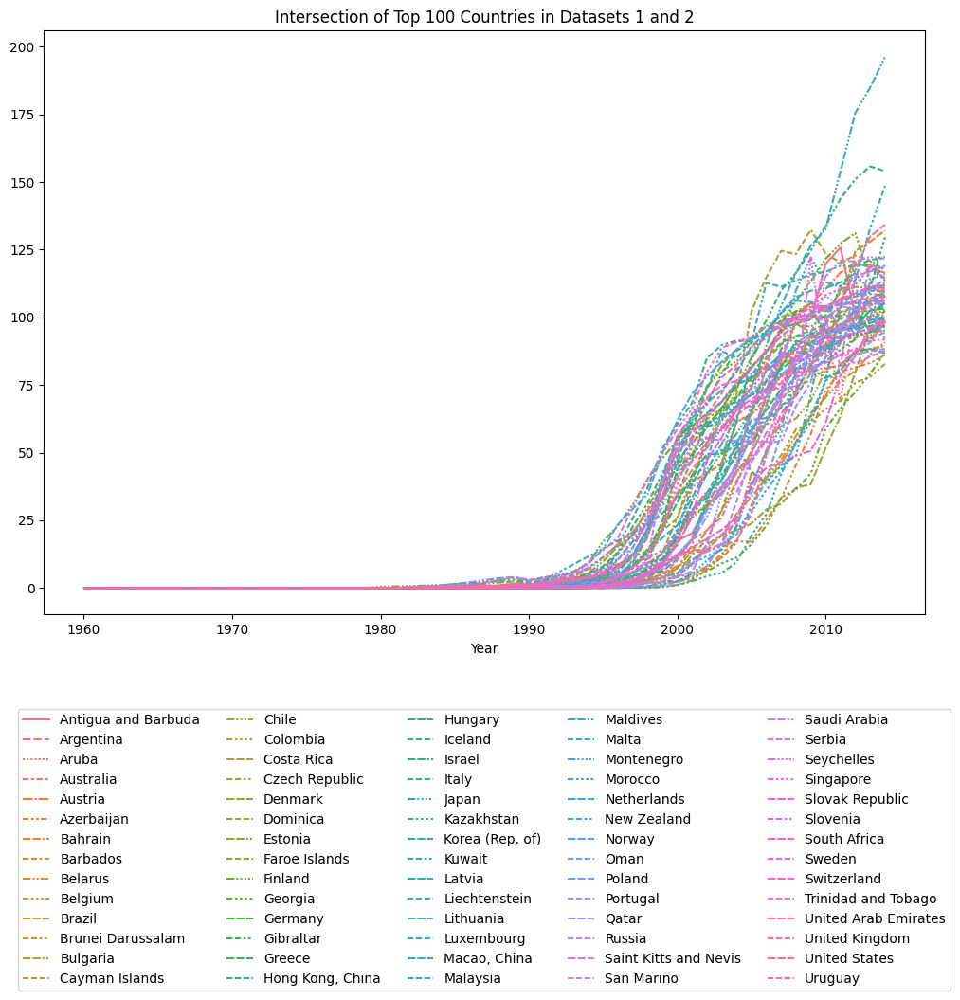

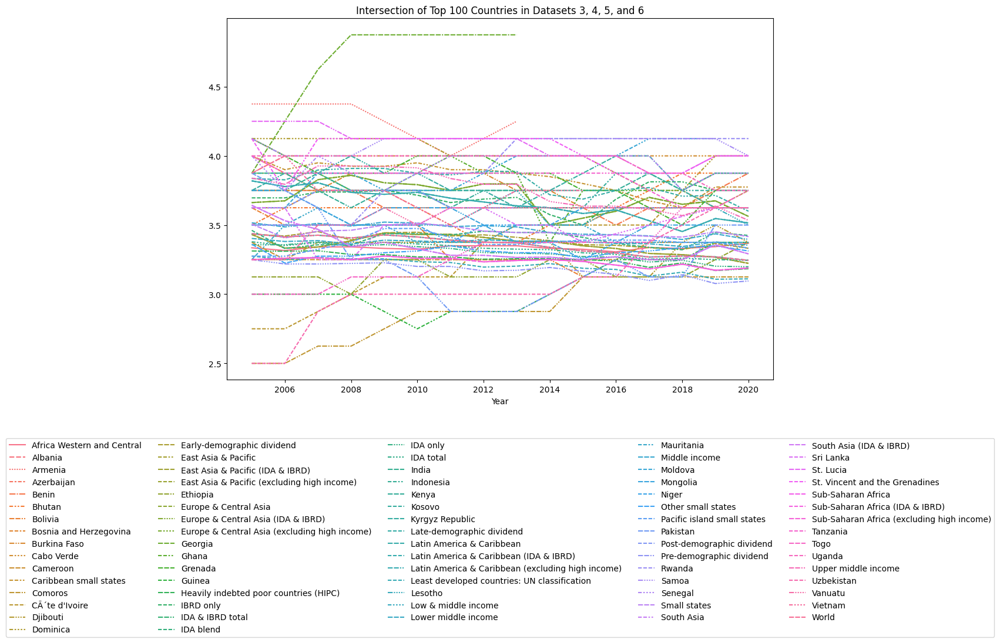

In [ ]:
csv_files = [
    'UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv',
    'UNdataExportPercentageOfIndividualsUsingTheInternet.csv',
    'CPIABusinessRegulatoryEnvironmentRating1to6.csv',
    'CPIAMacroeconomicManagementRating1to6.csv',
    'CPIAPropertyRightsAndRuleBasedGovernanceRating1to6.csv',
    'CPIATradeRating1to6.csv'
]

def get_most_recent_top_100(df):
    most_recent_years = df.groupby('Country')['Year'].max()
    most_recent_data = pd.merge(df, most_recent_years, on=['Country', 'Year'])
    top_100 = most_recent_data.nlargest(100, 'Value')['Country']
    return set(top_100)

def create_line_chart(df, common_countries, title):
    df_filtered = df[df['Country'].isin(common_countries)]
    df_grouped = df_filtered.groupby(['Country', 'Year'], as_index=False).mean()
    df_pivoted = df_grouped.pivot(index='Year', columns='Country', values='Value')
    plt.figure(figsize=(12, 8))
    sns.lineplot(data=df_pivoted)
    plt.title(title)
    plt.legend(bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=5)
    plt.show()
    
dataframes = [read_and_process_csv(csv_file) for csv_file in csv_files]

top_100_countries_list = [get_most_recent_top_100(df) for df in dataframes]

# Find the intersection of top 100 countries in datasets 1 and 2
common_top_100_datasets_1_and_2 = set.intersection(top_100_countries_list[0], top_100_countries_list[1])

# Find the intersection of top 100 countries in datasets 3, 4, 5, and 6
common_top_100_datasets_3_to_6 = set.intersection(top_100_countries_list[2], top_100_countries_list[3], top_100_countries_list[4], top_100_countries_list[5])

# Print common top 100 countries in datasets 1 and 2
print("Intersection of top 100 countries in datasets % internet users, and mobile subscriptions per 100 residents:")
print(sorted(list(common_top_100_datasets_1_and_2)))
print()

# Print common top 100 countries in datasets 3, 4, 5, and 6
print("Intersection of top 100 countries in datasets 3, 4, 5, and 6:")
print(sorted(list(common_top_100_datasets_3_to_6)))

# Create line charts for the intersection of top 100 countries in datasets 1 and 2
create_line_chart(pd.concat([dataframes[0], dataframes[1]]),
                  common_top_100_datasets_1_and_2,
                  'Intersection of Top 100 Countries in Datasets 1 and 2')

# Create line charts for the intersection of top 100 countries in datasets 3, 4, 5, and 6
create_line_chart(pd.concat([dataframes[2], dataframes[3], dataframes[4], dataframes[5]]),
                  common_top_100_datasets_3_to_6,
                  'Intersection of Top 100 Countries in Datasets 3, 4, 5, and 6')

In [10]:
import pandas as pd 
import numpy as np 
#4 Visualize the data using matplotlib and seaborn:
import matplotlib.pyplot as plt
import seaborn as sns 
import math 
from scipy import stats
import re
import csv
import plotly.graph_objs as go
from plotly.subplots import make_subplots



csv_files = [
    'UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv',
    'UNdataExportPercentageOfIndividualsUsingTheInternet.csv',
    'CPIABusinessRegulatoryEnvironmentRating1to6.csv',
    'CPIAMacroeconomicManagementRating1to6.csv',
    'CPIAPropertyRightsAndRuleBasedGovernanceRating1to6.csv',
    'CPIATradeRating1to6.csv'
]

def read_csv_remove_bad_lines(csv_file):
    expected_num_columns = 4

    with open(csv_file, 'r', encoding='utf-8', errors='replace') as file:
        reader = csv.reader(file)

        header = next(reader)
        valid_lines = [header]

        for line in reader:
            if len(line) == expected_num_columns:
                valid_lines.append(line)

    return pd.DataFrame(valid_lines[1:], columns=valid_lines[0])

def read_and_process_csv(csv_file):
    df = read_csv_remove_bad_lines(csv_file)
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', 'Value']
    df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
    df['Value'] = pd.to_numeric(df['Value'], errors='coerce')
    df = df.drop_duplicates(subset=['Country', 'Year'])
    df = df[~df['Country'].str.match(r'^\d+$')]
    df = df[df['Country'] != 'footnoteSeqID']
    return df

def get_most_recent_top_100(df):
    most_recent_years = df.groupby('Country')['Year'].max()
    most_recent_data = pd.merge(df, most_recent_years, on=['Country', 'Year'])
    top_100 = most_recent_data.nlargest(100, 'Value')['Country']
    return set(top_100)


# def create_interactive_line_chart(df, common_countries, title):
    # df_filtered = df[df['Country'].isin(common_countries)]
    # df_grouped = df_filtered.groupby(['Country', 'Year'], as_index=False).mean()
    
    # fig = make_subplots(specs=[[{"secondary_y": True}]])
    
    # for country in common_countries:
        # country_data = df_grouped[df_grouped['Country'] == country]
        # fig.add_trace(go.Scatter(x=country_data['Year'], y=country_data['Value'],
                                #  mode='lines+markers', name=country))
    
    # fig.update_layout(title=title, hovermode="x unified")
    # fig.show()    
import plotly.express as px

def create_interactive_line_chart(df, common_countries, title):
    df_filtered = df[df['Country'].isin(common_countries)]
    df_grouped = df_filtered.groupby(['Country', 'Year'], as_index=False).mean()
    
    fig = px.line(df_grouped, x='Year', y='Value', color='Country', 
              title=title, hover_name='Country', markers=True,
              category_orders={'Country': df_grouped.loc[df_grouped.groupby('Country')['Value'].idxmax()].sort_values('Value', ascending=False)['Country']})
    fig.show()    

dataframes = [read_and_process_csv(csv_file) for csv_file in csv_files]

top_100_countries_list = [get_most_recent_top_100(df) for df in dataframes]

# Find the intersection of top 100 countries in datasets 1 and 2
common_top_100_datasets_1_and_2 = set.intersection(top_100_countries_list[0], top_100_countries_list[1])

# Find the intersection of top 100 countries in datasets 3, 4, 5, and 6
common_top_100_datasets_3_to_6 = set.intersection(top_100_countries_list[2], top_100_countries_list[3], top_100_countries_list[4], top_100_countries_list[5])

# Print common top 100 countries in datasets 1 and 2
print("Intersection of top 100 countries in datasets % internet users, and mobile subscriptions per 100 residents:")
print(sorted(list(common_top_100_datasets_1_and_2)))
print()

# Print common top 100 countries in datasets 3, 4, 5, and 6
print("Intersection of top 100 countries in datasets 3, 4, 5, and 6:")
print(sorted(list(common_top_100_datasets_3_to_6)))

# Create line charts for the intersection of top 100 countries in datasets 1 and 2
create_interactive_line_chart(pd.concat([dataframes[0], dataframes[1]]),
                              common_top_100_datasets_1_and_2,
                              'Intersection of Top 100 Countries in Datasets 1 and 2')

# Create line charts for the intersection of top 100 countries in datasets 3, 4, 5, and 6
create_interactive_line_chart(pd.concat([dataframes[2], dataframes[3], dataframes[4], dataframes[5]]),
                              common_top_100_datasets_3_to_6,
                              'Intersection of Top 100 Countries in Datasets 3, 4, 5, and 6')

Intersection of top 100 countries in datasets % internet users, and mobile subscriptions per 100 residents:
['Antigua and Barbuda', 'Argentina', 'Aruba', 'Australia', 'Austria', 'Azerbaijan', 'Bahrain', 'Barbados', 'Belarus', 'Belgium', 'Brazil', 'Brunei Darussalam', 'Bulgaria', 'Cayman Islands', 'Chile', 'Colombia', 'Costa Rica', 'Czech Republic', 'Denmark', 'Dominica', 'Estonia', 'Faroe Islands', 'Finland', 'Georgia', 'Germany', 'Gibraltar', 'Greece', 'Hong Kong, China', 'Hungary', 'Iceland', 'Israel', 'Italy', 'Japan', 'Kazakhstan', 'Korea (Rep. of)', 'Kuwait', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Macao, China', 'Malaysia', 'Maldives', 'Malta', 'Montenegro', 'Morocco', 'Netherlands', 'New Zealand', 'Norway', 'Oman', 'Poland', 'Portugal', 'Qatar', 'Russia', 'Saint Kitts and Nevis', 'San Marino', 'Saudi Arabia', 'Serbia', 'Seychelles', 'Singapore', 'Slovak Republic', 'Slovenia', 'South Africa', 'Sweden', 'Switzerland', 'Trinidad and Tobago', 'United Arab Emirates', '